In [294]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os

## Loading data

In [270]:
rootPath = os.getcwd()
os.makedirs('data', exist_ok=True)

folder = 'data'
filePath = os.path.join(rootPath, folder)

fileFeatures = os.path.join(filePath, 'dengue_features_train.csv')
fileLabels = os.path.join(filePath, 'dengue_labels_train.csv')

X = pd.read_csv(os.path.join(filePath, fileFeatures))
y = pd.read_csv(os.path.join(filePath, fileLabels))

print(f"Data dimensions: X: {X.shape}, y: {y.shape}")


Data dimensions: X: (1456, 24), y: (1456, 4)


## 

In [271]:
# Join X and y for easy access
df = X.merge(y, on=['city', 'year', 'weekofyear'], how='left')


In [272]:
# Checking number of observations
obs = df[['city', 'year']].groupby(['city', 'year']).size().reset_index(name='n')
city_obs = obs.loc[:,['city','n']].groupby('city').agg('sum').reset_index()
city_obs

,city,n
0,iq,520
1,sj,936


### Checking Missing values

In [273]:
print(f"Number of variables with missing instances: {sum(df.isna().any())}")

Number of variables with missing instances: 20


In [274]:
z = df.isna().any()
z = z.loc[lambda x: x == True]
with_missing = list(z.index)

# count missing instances for each feature 
missingCounts = {}
for c in with_missing:
    missingCounts[c] = sum(X[c].isna())

# print(f"{c} : {sum(X[c].isna())}")
missingCounts

{'ndvi_ne': 194,
 'ndvi_nw': 52,
 'ndvi_se': 22,
 'ndvi_sw': 22,
 'precipitation_amt_mm': 13,
 'reanalysis_air_temp_k': 10,
 'reanalysis_avg_temp_k': 10,
 'reanalysis_dew_point_temp_k': 10,
 'reanalysis_max_air_temp_k': 10,
 'reanalysis_min_air_temp_k': 10,
 'reanalysis_precip_amt_kg_per_m2': 10,
 'reanalysis_relative_humidity_percent': 10,
 'reanalysis_sat_precip_amt_mm': 13,
 'reanalysis_specific_humidity_g_per_kg': 10,
 'reanalysis_tdtr_k': 10,
 'station_avg_temp_c': 43,
 'station_diur_temp_rng_c': 43,
 'station_max_temp_c': 20,
 'station_min_temp_c': 14,
 'station_precip_mm': 22}

In [275]:
with_missing

['ndvi_ne',
 'ndvi_nw',
 'ndvi_se',
 'ndvi_sw',
 'precipitation_amt_mm',
 'reanalysis_air_temp_k',
 'reanalysis_avg_temp_k',
 'reanalysis_dew_point_temp_k',
 'reanalysis_max_air_temp_k',
 'reanalysis_min_air_temp_k',
 'reanalysis_precip_amt_kg_per_m2',
 'reanalysis_relative_humidity_percent',
 'reanalysis_sat_precip_amt_mm',
 'reanalysis_specific_humidity_g_per_kg',
 'reanalysis_tdtr_k',
 'station_avg_temp_c',
 'station_diur_temp_rng_c',
 'station_max_temp_c',
 'station_min_temp_c',
 'station_precip_mm']

In [276]:
# drop rows with all missing features
df_allmiss = df[df[with_missing].isna().all(axis=1)]
df_allmiss 
df.dropna(axis=0, how='all', subset=with_missing, inplace=True)


In [277]:
df.isna().sum(axis=0)

city                                       0
year                                       0
weekofyear                                 0
week_start_date                            0
ndvi_ne                                  189
ndvi_nw                                   47
ndvi_se                                   17
ndvi_sw                                   17
precipitation_amt_mm                       8
reanalysis_air_temp_k                      5
reanalysis_avg_temp_k                      5
reanalysis_dew_point_temp_k                5
reanalysis_max_air_temp_k                  5
reanalysis_min_air_temp_k                  5
reanalysis_precip_amt_kg_per_m2            5
reanalysis_relative_humidity_percent       5
reanalysis_sat_precip_amt_mm               8
reanalysis_specific_humidity_g_per_kg      5
reanalysis_tdtr_k                          5
station_avg_temp_c                        38
station_diur_temp_rng_c                   38
station_max_temp_c                        15
station_mi

In [278]:
# get rows with too many missing values
df[df.isnull().sum(axis=1)>10]

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
87,sj,1992,1,1992-01-01,0.125100,0.157867,0.185283,0.181367,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81
399,sj,1998,1,1998-01-01,0.045500,0.047800,0.123986,0.083443,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64
711,sj,2004,1,2004-01-01,-0.268300,-0.123700,0.223757,0.176543,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15
1118,iq,2004,1,2004-01-01,0.202571,0.198967,0.244557,0.187957,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
1378,iq,2009,1,2009-01-01,0.151286,0.161686,0.153271,0.119443,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


In [279]:

# Drop these rows too
df = df[df.isnull().sum(axis=1)<10]

In [280]:
# checking mising values once again
# The remaining missing will then be imputed 
df[df.isnull().any(axis=1)]

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
5,sj,1990,23,1990-06-04,NaN,0.174850,0.254314,0.181743,9.58,299.630000,...,79.891429,9.58,17.212857,2.100000,28.114286,6.942857,34.4,23.9,39.1,2
9,sj,1990,27,1990-07-02,NaN,0.121550,0.160683,0.202567,14.41,300.154286,...,81.281429,14.41,18.071429,2.014286,28.328571,6.514286,33.9,24.4,1.1,6
13,sj,1990,31,1990-07-30,NaN,0.247150,0.379700,0.381357,32.66,299.862857,...,80.584286,32.66,17.594286,2.585714,28.242857,8.085714,34.4,22.8,37.6,17
14,sj,1990,32,1990-08-06,NaN,0.064333,0.164443,0.138857,28.80,300.391429,...,79.650000,28.80,17.950000,2.328571,28.200000,7.557143,33.3,23.3,11.4,23
15,sj,1990,33,1990-08-13,NaN,0.128033,0.206957,0.168243,90.75,299.958571,...,84.178571,90.75,18.515714,1.857143,28.042857,6.685714,32.8,22.8,44.7,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1365,iq,2008,40,2008-09-30,0.393086,0.378271,0.343700,0.404843,24.28,299.178571,...,79.502857,24.28,16.331429,12.785714,NaN,NaN,36.0,19.6,1.0,45
1400,iq,2009,23,2009-06-04,0.114000,0.092443,0.097471,0.126286,42.22,296.125714,...,95.507143,42.22,16.757143,6.071429,28.100000,11.800000,34.0,22.2,NaN,3
1409,iq,2009,32,2009-08-06,0.395000,0.352733,0.484286,0.401914,9.79,297.370000,...,87.811429,9.79,16.337143,11.757143,27.975000,12.100000,35.4,20.5,NaN,5
1431,iq,2010,1,2010-01-08,0.124571,0.179129,0.163843,0.135471,27.04,299.264286,...,78.271429,27.04,16.127143,11.100000,28.600000,12.300000,35.1,21.8,NaN,10


# Train-test split
- data is time series, we take a future set instead of random split
- Roughly 2 percent of data is used as test set for each city. Iq 2 years, Sj 3 years

In [281]:
# Train set
df_train_iq = df[(df['city']=='iq') & (~df['year'].isin([2009, 2010]))]
df_train_sj = df[(df['city']=='sj') & (~df['year'].isin([2006, 2007, 2008]))]
df_train = pd.concat((df_train_iq,df_train_sj), axis=0)

# Test set
df_test_iq = df[(df['city']=='iq') & (df['year'].isin([2009, 2010]))]
df_test_sj = df[(df['city']=='sj') & (df['year'].isin([2006, 2007, 2008]))]
df_test = pd.concat((df_test_iq,df_test_sj), axis=0)


# Missing value imputation
- Missing values are replaced by median values in corresponding year of each city
- Robust to outliers
- Done only for the training set to avoid data leakage
- EDA will be done based on training set

In [282]:
# Making it compatible with Pipelines
from sklearn.base import BaseEstimator, TransformerMixin

class MissingValueImputer(BaseEstimator, TransformerMixin):
    def __init__(self, features):
        self.features = features
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        X_copy = X.copy()
        for f in self.features:
            X_copy.loc[:, f] = X_copy.groupby(['city', 'weekofyear'])[f].transform(lambda x: x.fillna(x.median()))
        return X_copy

# Example usage:
imputer = MissingValueImputer(features=with_missing)
df_train = imputer.transform(df_train)


In [283]:
# Check missing values in the training set
df_train.isnull().any()

city                                     False
year                                     False
weekofyear                               False
week_start_date                          False
ndvi_ne                                  False
ndvi_nw                                  False
ndvi_se                                  False
ndvi_sw                                  False
precipitation_amt_mm                     False
reanalysis_air_temp_k                    False
reanalysis_avg_temp_k                    False
reanalysis_dew_point_temp_k              False
reanalysis_max_air_temp_k                False
reanalysis_min_air_temp_k                False
reanalysis_precip_amt_kg_per_m2          False
reanalysis_relative_humidity_percent     False
reanalysis_sat_precip_amt_mm             False
reanalysis_specific_humidity_g_per_kg    False
reanalysis_tdtr_k                        False
station_avg_temp_c                       False
station_diur_temp_rng_c                  False
station_max_t

## Exploratory data analysis

In [284]:
df_train.head()

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
936,iq,2000,26,2000-07-01,0.192886,0.132257,0.340886,0.247200,25.41,296.740000,...,92.418571,25.41,16.651429,8.928571,26.400000,10.775000,32.5,20.7,3.0,0
937,iq,2000,27,2000-07-08,0.216833,0.276100,0.289457,0.241657,60.61,296.634286,...,93.581429,60.61,16.862857,10.314286,26.900000,11.566667,34.0,20.8,55.6,0
938,iq,2000,28,2000-07-15,0.176757,0.173129,0.204114,0.128014,55.52,296.415714,...,95.848571,55.52,17.120000,7.385714,26.800000,11.466667,33.0,20.7,38.1,0
939,iq,2000,29,2000-07-22,0.227729,0.145429,0.254200,0.200314,5.60,295.357143,...,87.234286,5.60,14.431429,9.114286,25.766667,10.533333,31.5,14.7,30.0,0
940,iq,2000,30,2000-07-29,0.328643,0.322129,0.254371,0.361043,62.76,296.432857,...,88.161429,62.76,15.444286,9.500000,26.600000,11.480000,33.3,19.1,4.0,0


In [285]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1249 entries, 936 to 814
Data columns (total 25 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   city                                   1249 non-null   object 
 1   year                                   1249 non-null   int64  
 2   weekofyear                             1249 non-null   int64  
 3   week_start_date                        1249 non-null   object 
 4   ndvi_ne                                1249 non-null   float64
 5   ndvi_nw                                1249 non-null   float64
 6   ndvi_se                                1249 non-null   float64
 7   ndvi_sw                                1249 non-null   float64
 8   precipitation_amt_mm                   1249 non-null   float64
 9   reanalysis_air_temp_k                  1249 non-null   float64
 10  reanalysis_avg_temp_k                  1249 non-null   float64
 11  reanalys

In [286]:
# Convert week start date to datetime format
df_train['week_start_date'] = pd.to_datetime(df_train['week_start_date'])
df_train

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
936,iq,2000,26,2000-07-01,0.192886,0.132257,0.340886,0.247200,25.41,296.740000,...,92.418571,25.41,16.651429,8.928571,26.400000,10.775000,32.5,20.7,3.0,0
937,iq,2000,27,2000-07-08,0.216833,0.276100,0.289457,0.241657,60.61,296.634286,...,93.581429,60.61,16.862857,10.314286,26.900000,11.566667,34.0,20.8,55.6,0
938,iq,2000,28,2000-07-15,0.176757,0.173129,0.204114,0.128014,55.52,296.415714,...,95.848571,55.52,17.120000,7.385714,26.800000,11.466667,33.0,20.7,38.1,0
939,iq,2000,29,2000-07-22,0.227729,0.145429,0.254200,0.200314,5.60,295.357143,...,87.234286,5.60,14.431429,9.114286,25.766667,10.533333,31.5,14.7,30.0,0
940,iq,2000,30,2000-07-29,0.328643,0.322129,0.254371,0.361043,62.76,296.432857,...,88.161429,62.76,15.444286,9.500000,26.600000,11.480000,33.3,19.1,4.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
810,sj,2005,47,2005-11-26,0.076400,0.165400,0.215914,0.185229,14.49,299.467143,...,77.245714,14.49,16.548571,2.585714,26.528571,6.085714,30.0,22.2,23.6,22
811,sj,2005,48,2005-12-03,0.108625,0.182300,0.268600,0.248186,26.65,299.182857,...,78.624286,26.65,16.571429,2.414286,26.228571,5.871429,30.6,22.8,80.7,26
812,sj,2005,49,2005-12-10,-0.033967,0.041350,0.181267,0.206850,0.00,298.578571,...,71.455714,0.00,14.507143,2.742857,24.985714,6.328571,28.9,20.6,27.5,13
813,sj,2005,50,2005-12-17,-0.058700,-0.077533,0.166757,0.169514,0.00,299.131429,...,75.075714,0.00,15.721429,2.171429,25.457143,6.028571,29.4,21.1,30.0,17


In [287]:
# checking if conversion was successful
type(df_train['week_start_date'][0])

pandas._libs.tslibs.timestamps.Timestamp

In [288]:
df_train.columns
datetimecols = ['city',	'year',	'weekofyear', 'week_start_date']
features = [c for c in df_train.columns if c not in datetimecols]

# TIME SERIES PLOTS

## All cities

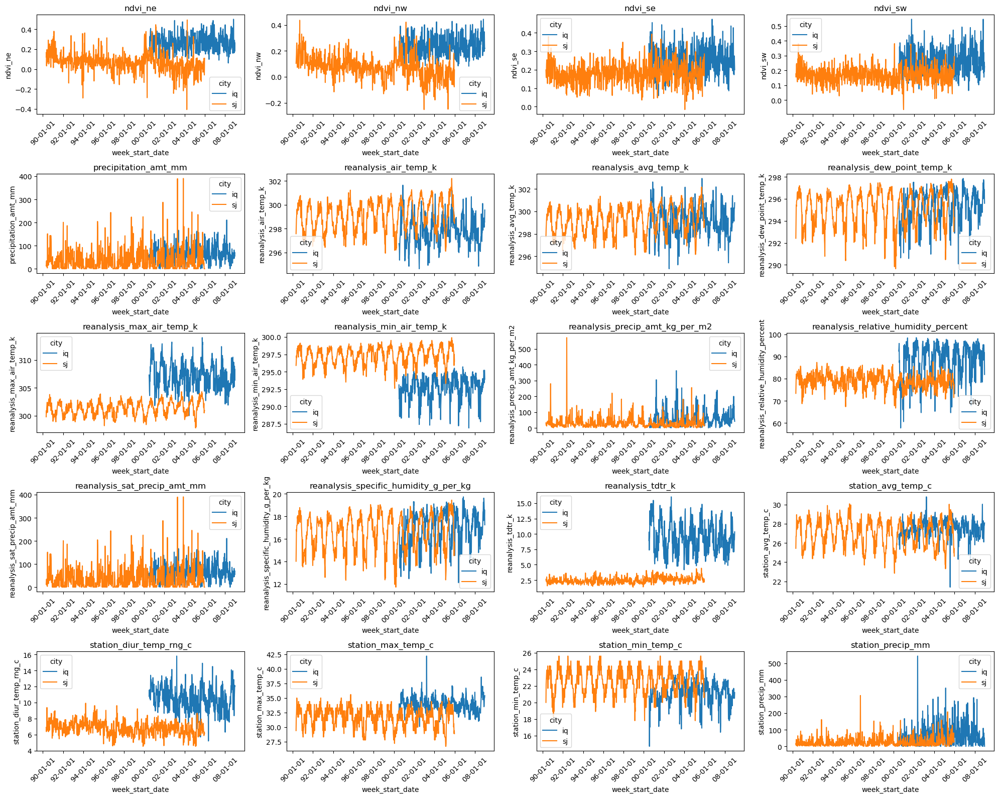

In [289]:
import matplotlib.dates as mdates

def linePlots(data, hue=None):
    fig, axs = plt.subplots(5, 4, figsize=(20, 16))
    axs = axs.ravel()

    for col, ax in zip(features, axs):
        sns.lineplot(x='week_start_date', y=col, ax=ax, data=data, hue=hue)
        ax.xaxis.set_major_locator(mdates.AutoDateLocator(minticks=5, maxticks=15))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%y-%m-%d'))
        ax.set_title(col)
        ax.tick_params(axis='x', rotation=45)  # Add this line
    plt.tight_layout()
    plt.show()

linePlots(data=df_train, hue='city')

## San Juan
- There appears to be some outliers


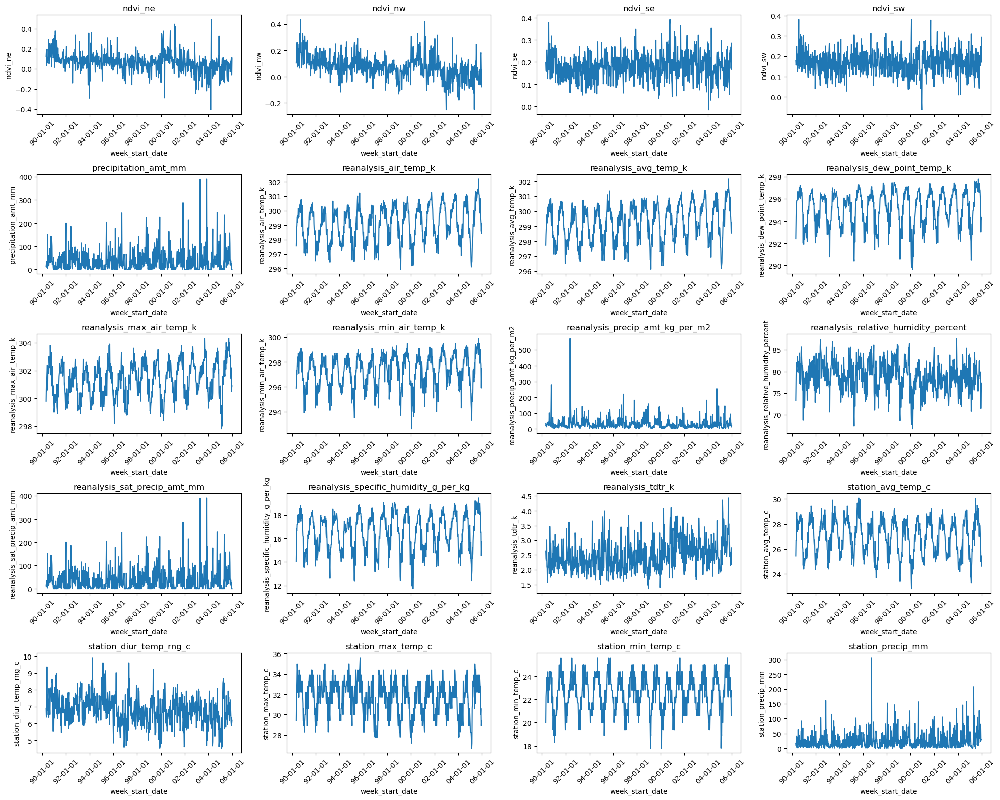

In [290]:
# Data
df_train_sj = df_train.query("city=='sj'")
linePlots(data=df_train_sj)

## Iquitos
- There appears to be some outliers

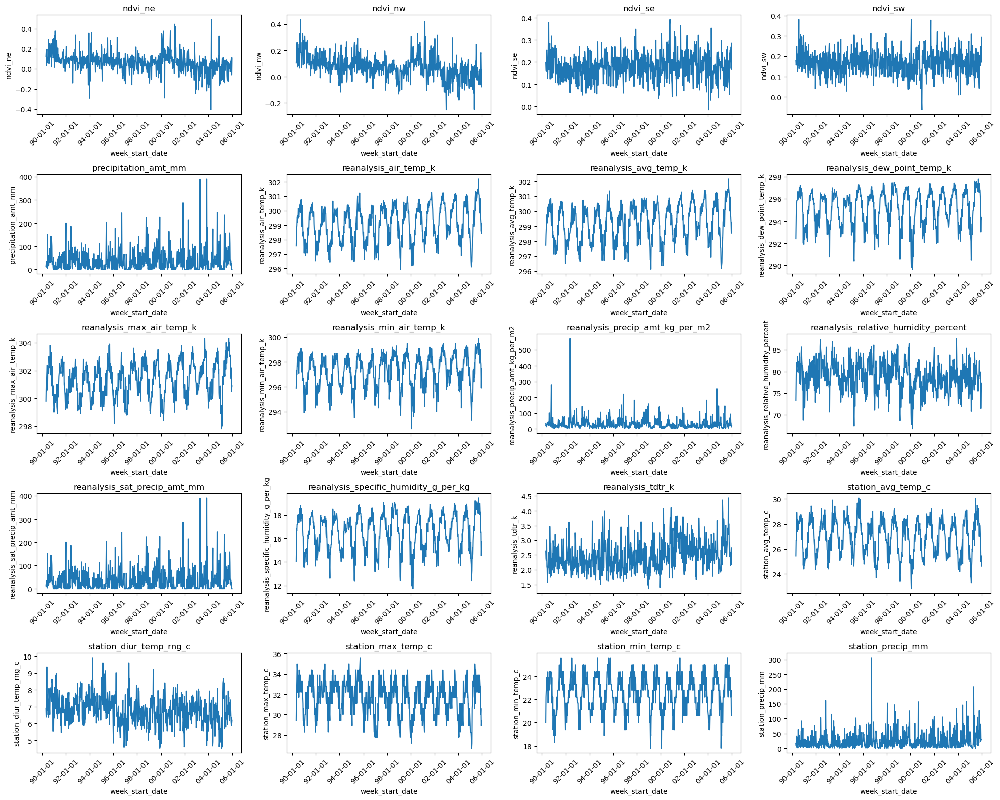

In [291]:
df_train_iq = df_train.query("city!='iq'")
linePlots(data=df_train_iq, hue=None)

## Correlation analysis
Based on the Heatmap above, we observe the following:
*   Vegetation at north east "ndvi_ne" and north west  "ndvi_nw"are highly positively correlated at 0.85 and the vegetation south east "ndvi_se" and southwest "ndvi_sw" positively correlated at 0.82
*   The Average air temperature "reanalysis_avg_temp_k" and  Mean air temperature "reanalysis_air_temp_k" are highly positively correlated at 0.90
*   The Diurnal temperature range "reanalysis_tdtr_k" and Maximum air temperature "reanalysis_max_air_temp_k" are highly positively correlated at 0.92
*    The Diurnal temperature range "reanalysis_tdtr_k" and Total precipitation "reanalysis_precip_amt_kg_per_m2" have a low correlation of 0.094
*   The Mean relative humidity "reanalysis_relative_humidity_percent" and Minimum temperature "station_min_temp_c" have low negative correlation -0.043
* All features seem be weakly correlated with `total_cases`




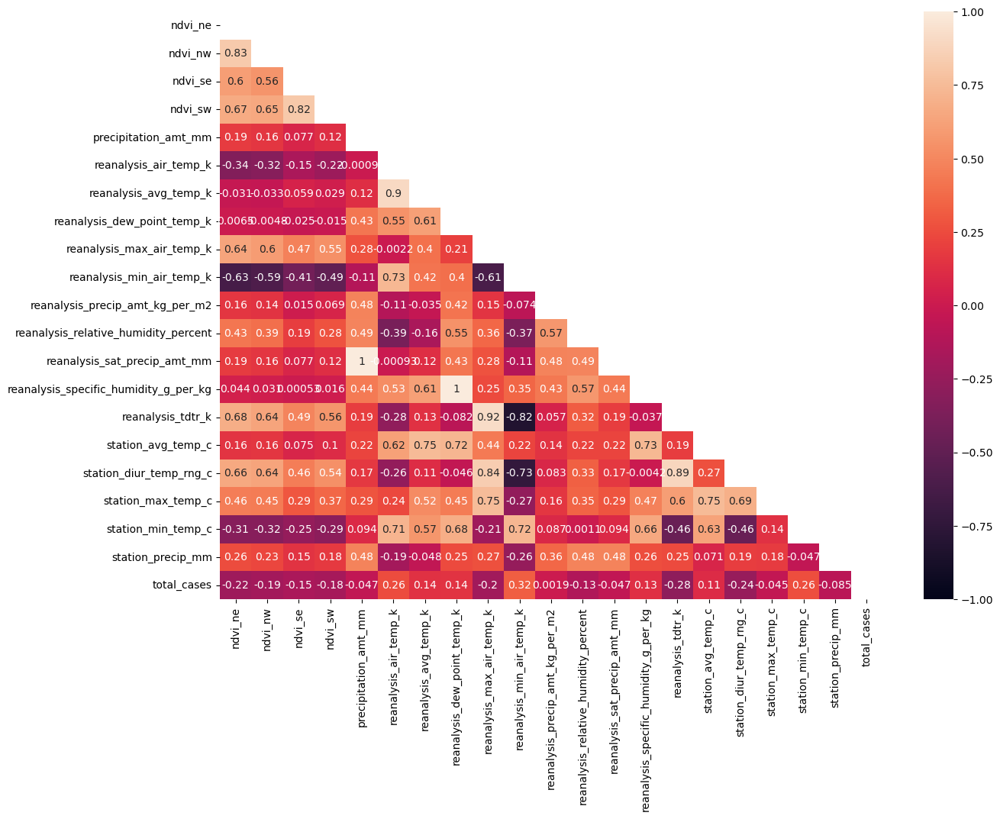

In [313]:
corrMat = df_train.loc[:,features].corr()

mask = np.zeros_like(corrMat)
mask[np.triu_indices_from(mask)]=True


import seaborn as sns
plt.figure(figsize =(14,10))
sns.heatmap(corrMat,vmin = -1, vmax = 1, annot=True, mask=mask)
plt.show()


In [324]:
len(features)

NameError: name 'features_set1' is not defined

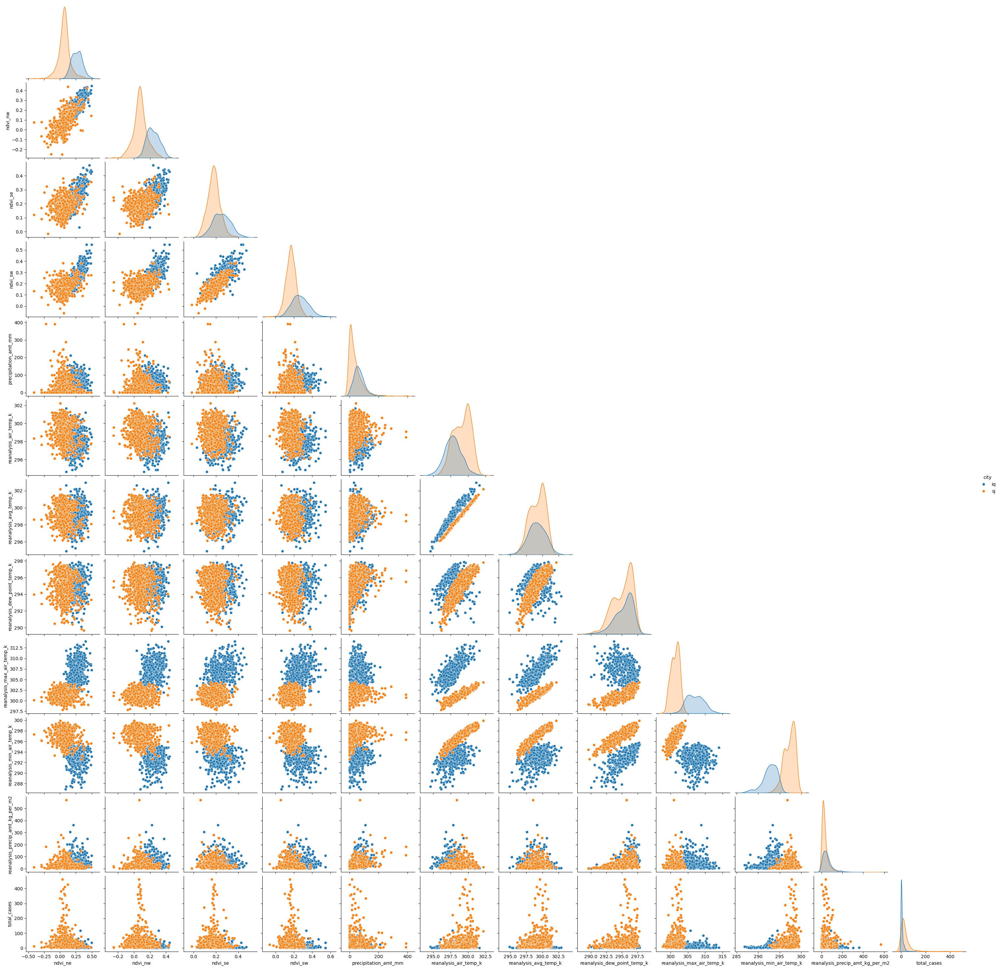

In [326]:
features_set1 = features[:11] + [features[-1]]


sns.pairplot(data=df_train,vars=features_set1, corner=True, hue='city')
plt.show()

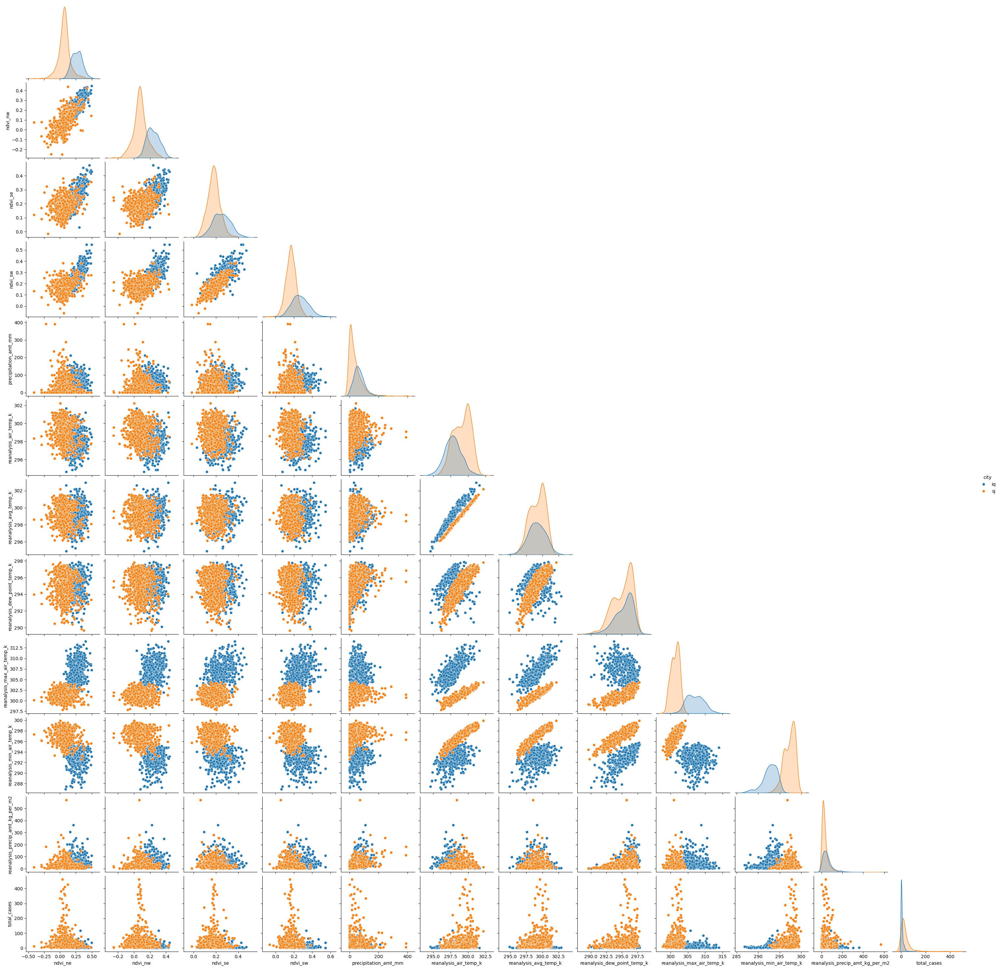

In [327]:
features_set2 = features[11:] + [features[-1]]


sns.pairplot(data=df_train,vars=features_set1, corner=True, hue='city')
plt.show()

## Dengue cases


In [16]:
y1 = pd.concat((X.loc[:,'week_start_date'],y),axis=1)
# y1['week_start_date']


## Dengue cases time series

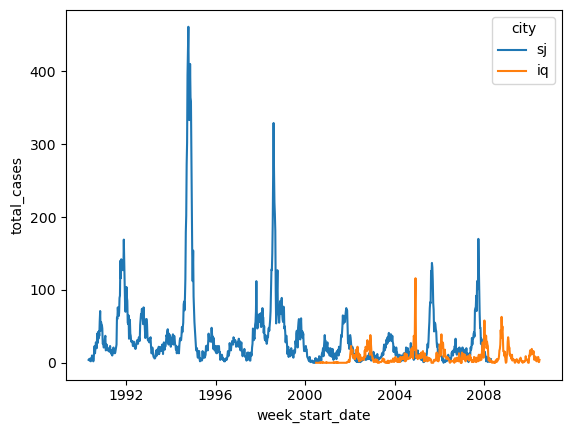

In [17]:
sns.lineplot(data=y1, x= 'week_start_date', y = 'total_cases', hue='city')
plt.show()

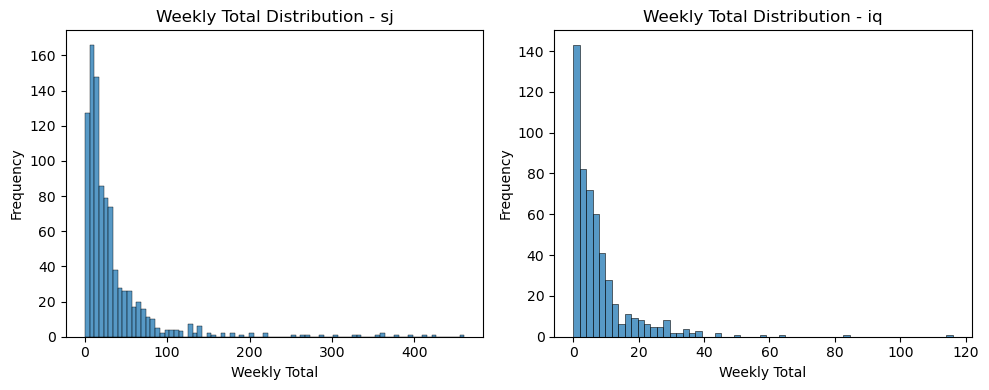

In [18]:
# 
def yearly_pattern(labels_data, city_col, total_cases_col):

    cities = labels_data[city_col].unique()
    num_cities = len(cities)
    fig, axes = plt.subplots(ncols=num_cities, figsize=(10, 4))

    # Iterate over each city and plot distplot
    for i, city in enumerate(cities):
        city_data = labels_data[labels_data[city_col] == city][total_cases_col]
        sns.histplot(city_data, kde=False, ax=axes[i])
        axes[i].set_title(f'Weekly Total Distribution - {city}')
        axes[i].set_xlabel('Weekly Total')
        axes[i].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()


yearly_pattern(y, 'city', 'total_cases')

Seems like week 1 and week 53 are the most problematic in the dataset

In [ ]:
# Computing median by week
def medianByWeek(df):
    df_med = df[features+['weekofyear']].groupby(['city', 'weekofyear']).agg('median').reset_index()
    rename_dict = {}
    for feature in features:
        rename_dict[feature]='med_'+feature
        df_med.rename(rename_dict, inplace=True, axis=1)
    return df_med

df_med = medianByWeek(df=df)

NameError: name 'df' is not defined

## Median of features by week

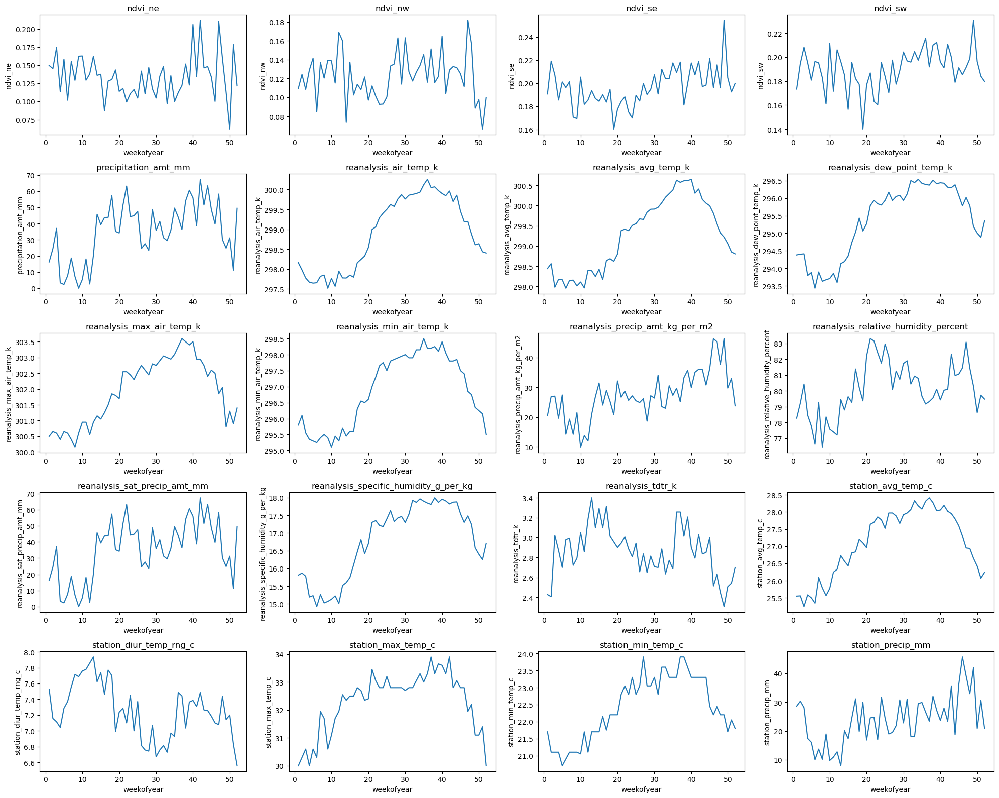

In [ ]:
features = df_med.columns[1:]

fig, axs = plt.subplots(5,4, figsize = (20,16))
axs = axs.ravel()

for f, ax in zip(features,axs):
    sns.lineplot(data=df_med, x = 'weekofyear', y=f, ax=ax)
    ax.set_title(f)
plt.tight_layout()


## imputation of Missing Values

In [ ]:
features[5]

'reanalysis_air_temp_k'

## Features vs Target (standardized)

In [329]:
import sklearn
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
all_scaled = scaler.fit_transform(X=df.iloc[:,4:])
scaler.get_feature_names_out()
df_scaled = pd.DataFrame(all_scaled, columns=scaler.get_feature_names_out())
df_scaled = pd.concat((X[datetimecols], df_scaled), axis=1)

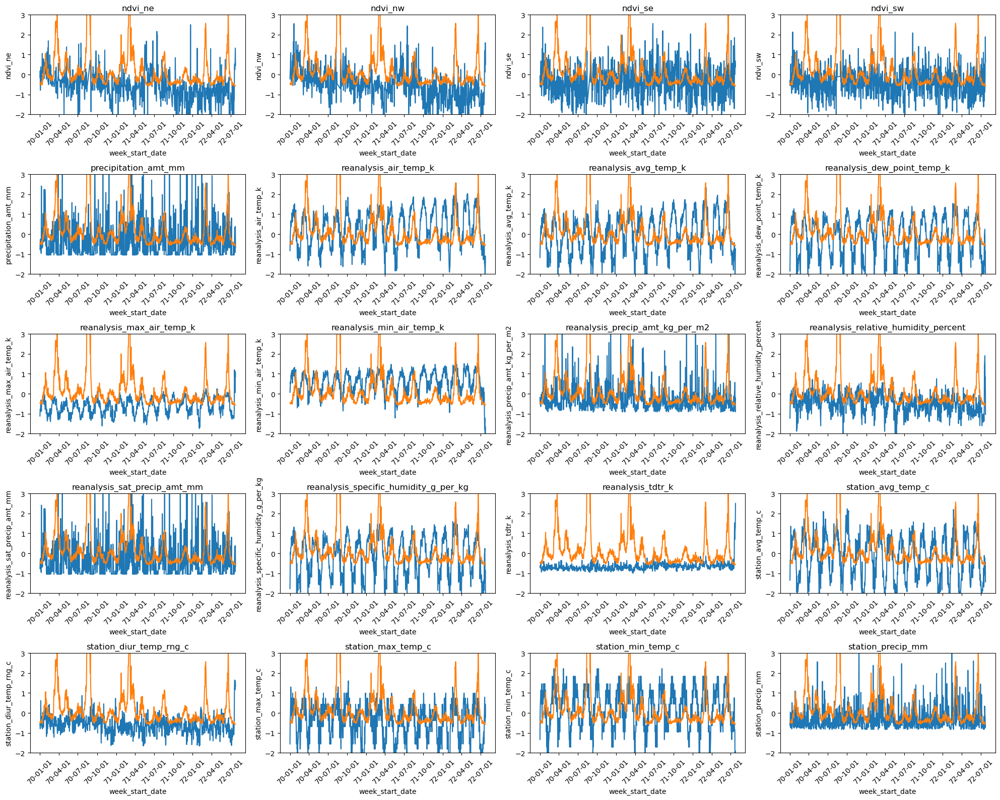

In [333]:
def linePlots2(data, features,hue=None):
    fig, axs = plt.subplots(5, 4, figsize=(20, 16))
    axs = axs.ravel()

    for col, ax in zip(features, axs):
        sns.lineplot(x='week_start_date', y=col, ax=ax, data=data, hue=hue)
        sns.lineplot(x='week_start_date', y='total_cases', ax=ax, data=data, hue=hue)
        ax.xaxis.set_major_locator(mdates.AutoDateLocator(minticks=5, maxticks=15))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%y-%m-%d'))
        ax.set_title(col)
        ax.tick_params(axis='x', rotation=45)
        ax.set_ylim(-2,3)
    plt.tight_layout()
    plt.show()

linePlots2(data=df_scaled[df_scaled['city']=='sj'], features=features)

## Box plots
- The scales of features are quite different, scling may be necessary for non-tree based algorithms
- Outliers are also evident especially for precipitation

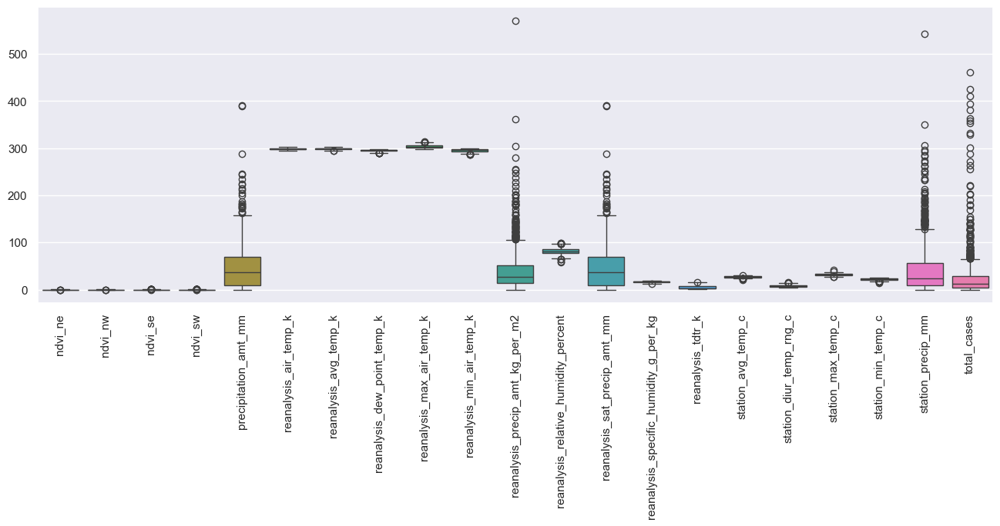

In [345]:
sns.set(rc={'figure.figsize': (16, 5)})

# Create the boxplot
ax = sns.boxplot(data=df_train[features[:]])
ax.tick_params(axis='x', rotation=90)


# Show the plot
plt.show()

In [ ]:
df_scaled['weekofyear'].unique()

array([18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 53], dtype=int64)